## Connect


In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
!gdown 1-8gPduhJo3_YULqqhGJDutbLmwQoBOgq
!unzip /content/makeup_data.zip

Downloading...
From: https://drive.google.com/uc?id=1-8gPduhJo3_YULqqhGJDutbLmwQoBOgq
To: /content/makeup_data.zip
100% 273M/273M [00:02<00:00, 112MB/s]
Archive:  /content/makeup_data.zip
replace makeup_data/test/36.png? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

## Import Module/Library

In [3]:
import os
import sys
import glob
import numpy as np
import matplotlib.pyplot as plt

!pip install -qqq -U rich

!pip install -qqq ipywidgets

import gc
import rich
from rich.progress import track
import torch
import torchvision
from torchvision.utils import make_grid
from torchvision.transforms.functional import resize
import torch.nn as nn
from torch.utils.data import DataLoader
!pip install -qqq torchmetrics
import torchmetrics
!pip install -qqq torchsummary
from torchsummary import summary
import torch.nn.functional as F
from torch import optim
from PIL import Image
from torchvision import transforms as T
from torchvision import models
!pip install -qqq graphviz
!pip install -qqq torchviz
from torchviz import make_dot

import warnings
warnings.filterwarnings('ignore')

print(f'Pytorch version: {torch.__version__}')
print(f'Python version: P{sys.version}')


Pytorch version: 2.0.1+cu118
Python version: P3.10.11 (main, Apr  5 2023, 14:15:10) [GCC 9.4.0]


## Config Parameters

In [22]:
IMG_PATH = "/content/makeup_data"

class cfg:
    IMG_HEGIHT  = 224
    IMG_WIDHT   = 224
    IMG_CHANNEL = 3
    BATCH_SIZE = 32
    epochs = 150
    num_workers = 8
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

##  Load Data

In [23]:
train_dir = '/content/makeup_data/train'
val_dir = '/content/makeup_data/val'
test_dir = '/content/makeup_data/test'

def file_list(data_dir):
    file_list = []
    file_list += glob.glob(os.path.join(data_dir + '/', '*.png'))
    return file_list

In [24]:
def load(image_file):
    image = torchvision.io.read_image(image_file)
    
    # Split each image tensor into two tensors:
    # - non-makeup image
    # - makeup image
    w = image.size()[2]
    w = w // 3
    input_image  = image[:, :, w*2:w*3]
    target_image = image[:, :, w:w*2]

    input_image  = resize(input_image, [cfg.IMG_HEGIHT, cfg.IMG_WIDHT])
    target_image = resize(target_image, [cfg.IMG_HEGIHT, cfg.IMG_WIDHT])
    
    # Convert both images to float32 tensors
    input_image  = input_image.float()
    target_image = target_image.float()
    
    return input_image, target_image

torch.Size([3, 224, 224])
torch.Size([3, 224, 224])


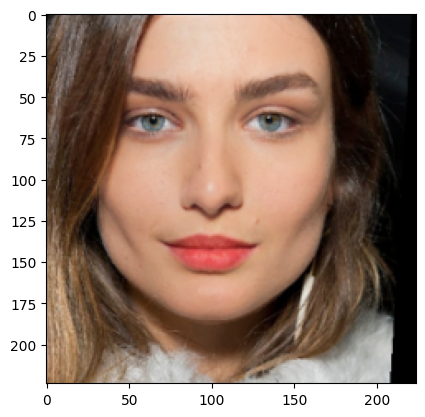

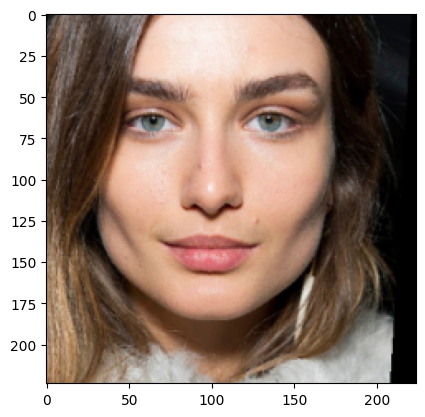

In [25]:
input_image, target_image = load(str(IMG_PATH + '/train/0.png'))
print(input_image.shape)
print(target_image.shape)


# casting to int for matplotlib to show the image
plt.figure()
plt.imshow(input_image.permute(1,2,0)/255)
plt.figure()
plt.imshow(target_image.permute(1,2,0)/255)


In [26]:
class dataset(torch.utils.data.Dataset):
    """Some Information about dataset"""
    def __init__(self, file_list, train=True):
        self.file_list = file_list
        self.train = train
        self.normalize = T.Normalize(mean=[0.485, 0.456, 0.406],std=[0.229, 0.224, 0.225])
        
    def __getitem__(self, index):
        
        img_path = self.file_list[index]
        input_image, target_image = load(img_path)
        if self.train == True:
            if torch.rand(()) > 0.5:
                # Random mirroring
                input_image = torch.fliplr(input_image)
                target_image = torch.fliplr(target_image)
            input_image = self.normalize(input_image/255.0)
            target_image = (target_image / 255.0)
            return input_image, target_image
        else: 
            input_image = self.normalize(input_image/255.0)
            target_image = (target_image / 255.0)
            return input_image, target_image

    def __len__(self):
        return len(self.file_list)

In [27]:
invTrans = T.Compose([T.Normalize(mean = [ 0., 0., 0. ], std = [ 1/0.229, 1/0.224, 1/0.225 ]),
                      T.Normalize(mean = [ -0.485, -0.456, -0.406 ], std = [ 1., 1., 1. ])])

In [28]:
train_data = dataset(file_list(train_dir), train=True)
valid_data = dataset(file_list(val_dir), train=False)
test_data = dataset(file_list(test_dir), train=False)

In [29]:
train_loader = DataLoader(dataset=train_data, batch_size=cfg.BATCH_SIZE, shuffle=True, num_workers=cfg.num_workers, pin_memory=True)
valid_loader = DataLoader(dataset=valid_data, batch_size=cfg.BATCH_SIZE, shuffle=True, num_workers=cfg.num_workers, pin_memory=True)
test_loader = DataLoader(dataset=test_data, batch_size=cfg.BATCH_SIZE, shuffle=True, num_workers=cfg.num_workers, pin_memory=True)


## Build Model 

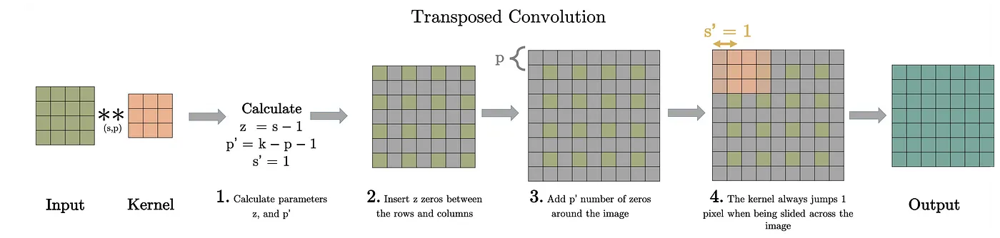

In [30]:
class res50Unet(nn.Module):
    """Some Information about res50Unet"""
    def __init__(self):
        super(res50Unet, self).__init__()

        self.backbone = models.resnet50(pretrained=True)

        # input: [1, 3, 224, 224]
        self.enb0 = nn.Sequential(*list(self.backbone.children())[:4]).requires_grad_(False) # [1, 64, 56, 56]
        self.enb1 = self.backbone.layer1.requires_grad_(False) # [1, 256, 56, 56]
        self.enb2 = self.backbone.layer2.requires_grad_(False) # [1, 512, 28, 28]
        self.enb3 = self.backbone.layer3.requires_grad_(False) # [1, 1024, 14, 14]

        self.bridge = self.backbone.layer4.requires_grad_(False) # [1, 2048, 7, 7]

        self.deb3 = nn.ConvTranspose2d(2048, 1024, kernel_size=2, stride=2, padding=0)
        self.conv_block3 = self.conv_block(2048, 1024, 3, 1)
                
        self.deb2 = nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2, padding=0)
        self.conv_block2 = self.conv_block(1024, 512, 3, 1)
                         
        self.deb1 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2, padding=0)
        self.conv_block1 = self.conv_block(512, 256, 3, 1)
                         
        self.deb0 = nn.ConvTranspose2d(256, 64, kernel_size=3, stride=1, padding=1)
        self.conv_block0 = self.conv_block(128, 64, 3, 1)

        self.first_feature = nn.Conv2d(3, 64, kernel_size=3, padding='same')
        self.deb_final = nn.Sequential(
                         nn.ConvTranspose2d(64, 64, kernel_size=2, stride=2, padding=0),
                         nn.ConvTranspose2d(64, 64, kernel_size=2, stride=2, padding=0),
                )
        self.conv_block_final = self.conv_block(128, 64, 3, 1)
        self.output = nn.Conv2d(64, 3, 1)
        self.sigmoid = nn.Sigmoid()

    def conv_block(self, in_channels, out_channels, kernel, padding):
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel, padding=padding),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(inplace=True),

            nn.Conv2d(out_channels, out_channels, kernel, padding=padding),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(inplace=True),
        )

    def forward(self, x):

        x_first = self.first_feature(x)

        x = self.enb0(x)
        skip_0 = x

        x = self.enb1(x)
        skip_1 = x

        x = self.enb2(x)
        skip_2 = x

        x = self.enb3(x)
        skip_3 = x

        x_bridge = self.bridge(x)

        x3 = self.deb3(x_bridge)
        x3 = torch.cat([skip_3, x3], dim=1)
        x3 = self.conv_block3(x3)

        x2 = self.deb2(x3)
        x2 = torch.cat([skip_2, x2], dim=1)
        x2 = self.conv_block2(x2)

        x1 = self.deb1(x2)
        x1 = torch.cat([skip_1, x1], dim=1)
        x1 = self.conv_block1(x1)
        
        x0 = self.deb0(x1)
        x0 = torch.cat([skip_0, x0], dim=1)
        x0 = self.conv_block0(x0)

        x_final = self.deb_final(x0)
        x_final = torch.cat([x_first, x_final], dim=1)
        x_final = self.conv_block_final(x_final)

        x_final = self.output(x_final)
        x_final = self.sigmoid(x_final)

        return x_final

In [31]:
model = res50Unet().to(cfg.device)
summary(model, (3,224,224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 224, 224]           1,792
            Conv2d-2         [-1, 64, 112, 112]           9,408
            Conv2d-3         [-1, 64, 112, 112]           9,408
       BatchNorm2d-4         [-1, 64, 112, 112]             128
       BatchNorm2d-5         [-1, 64, 112, 112]             128
              ReLU-6         [-1, 64, 112, 112]               0
              ReLU-7         [-1, 64, 112, 112]               0
         MaxPool2d-8           [-1, 64, 56, 56]               0
         MaxPool2d-9           [-1, 64, 56, 56]               0
           Conv2d-10           [-1, 64, 56, 56]           4,096
           Conv2d-11           [-1, 64, 56, 56]           4,096
      BatchNorm2d-12           [-1, 64, 56, 56]             128
      BatchNorm2d-13           [-1, 64, 56, 56]             128
             ReLU-14           [-1, 64,

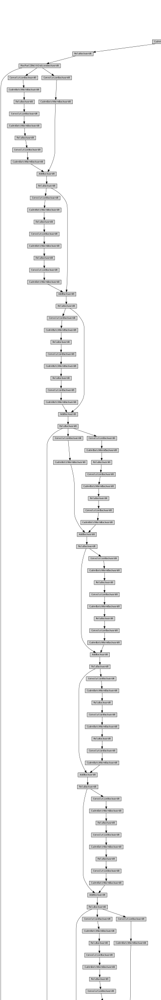

In [32]:
x = torch.randn(1, 3, 224, 224).to(cfg.device).requires_grad_(True)
make_dot(model(x), params=dict(model.named_parameters()))

## Loss

In [33]:
#https://gist.github.com/alper111/8233cdb0414b4cb5853f2f730ab95a49

class VGG19PerceptualLoss(torch.nn.Module):
    def __init__(self):
        super(VGG19PerceptualLoss, self).__init__()
        blocks = []
        blocks.append(torchvision.models.vgg19(pretrained=True).features[:4].eval())
        blocks.append(torchvision.models.vgg19(pretrained=True).features[4:9].eval())
        blocks.append(torchvision.models.vgg19(pretrained=True).features[9:18].eval())
        blocks.append(torchvision.models.vgg19(pretrained=True).features[18:27].eval())
        blocks.append(torchvision.models.vgg19(pretrained=True).features[27:36].eval())
        for bl in blocks:
            for p in bl.parameters():
                p.requires_grad = False
        self.blocks = torch.nn.ModuleList(blocks).to(cfg.device)
        self.transform = torch.nn.functional.interpolate
        self.register_buffer("mean", torch.tensor([0.485, 0.456, 0.406]).view(1, 3, 1, 1))
        self.register_buffer("std", torch.tensor([0.229, 0.224, 0.225]).view(1, 3, 1, 1))

    def forward(self, input, target):
        self.mean = self.mean.to(cfg.device)
        self.std = self.std.to(cfg.device)

        input = (input-self.mean) / self.std
        target = (target-self.mean) / self.std

        loss = 0.0
        x = input*255.0
        y = target*255.0
        for block in self.blocks:
            x = block(x)
            y = block(y)
            loss += nn.functional.mse_loss(x, y)
        return loss

## Training

In [34]:
torch.cuda.empty_cache()
gc.collect()
torch.cuda.memory_summary(device=None, abbreviated=False)

'|===========================================================================|\n|                  PyTorch CUDA memory summary, device ID 0                 |\n|---------------------------------------------------------------------------|\n|            CUDA OOMs: 0            |        cudaMalloc retries: 0         |\n|===========================================================================|\n|        Metric         | Cur Usage  | Peak Usage | Tot Alloc  | Tot Freed  |\n|---------------------------------------------------------------------------|\n| Allocated memory      |   1260 MiB |   8049 MiB |   9503 GiB |   9502 GiB |\n|       from large pool |   1216 MiB |   8024 MiB |   9501 GiB |   9500 GiB |\n|       from small pool |     44 MiB |     87 MiB |      2 GiB |      2 GiB |\n|---------------------------------------------------------------------------|\n| Active memory         |   1260 MiB |   8049 MiB |   9503 GiB |   9502 GiB |\n|       from large pool |   1216 MiB |   8024 MiB |

In [35]:
per_loss = VGG19PerceptualLoss()
def generator_loss(fake, target):
    loss = per_loss(target, fake)
    return loss

generator_optimizer = torch.optim.Adam(params = model.parameters(), lr=1e-4)
torch.autograd.set_detect_anomaly(True)

Output()

epoch: 0   loss: 322903.65625

-------- psnr:  16.862022    ----- epoch:  0

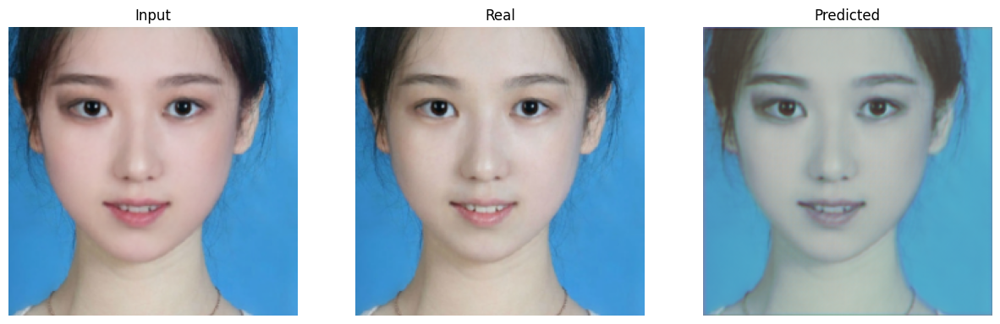

epoch: 1   loss: 124074.546875

-------- psnr:  22.71085    ----- epoch:  1

epoch: 2   loss: 77848.390625

-------- psnr:  23.706163    ----- epoch:  2

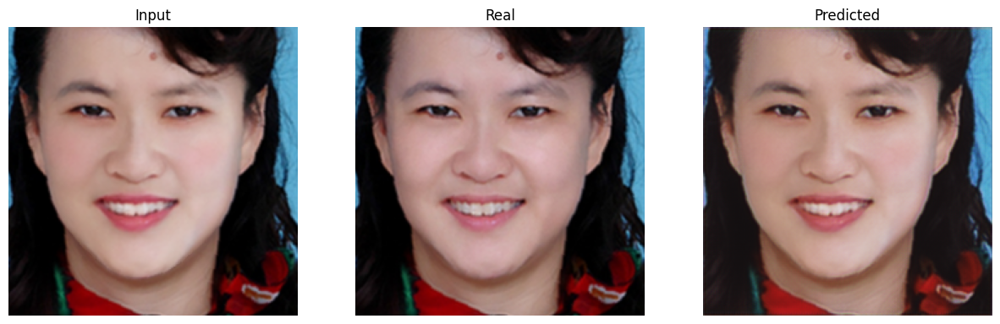

epoch: 3   loss: 64944.0546875

-------- psnr:  23.645151    ----- epoch:  3

epoch: 4   loss: 58833.53515625

-------- psnr:  23.688238    ----- epoch:  4

epoch: 5   loss: 55594.88671875

-------- psnr:  23.568367    ----- epoch:  5

epoch: 6   loss: 53539.140625

-------- psnr:  23.96903    ----- epoch:  6

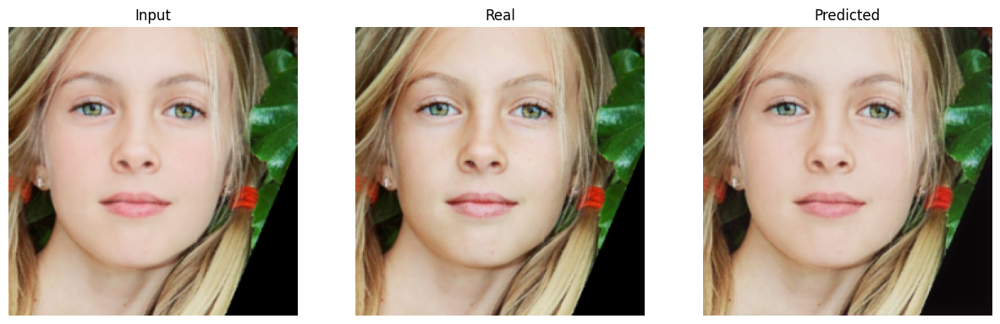

epoch: 7   loss: 51698.66015625

-------- psnr:  23.941313    ----- epoch:  7

epoch: 8   loss: 50279.8046875

-------- psnr:  24.042889    ----- epoch:  8

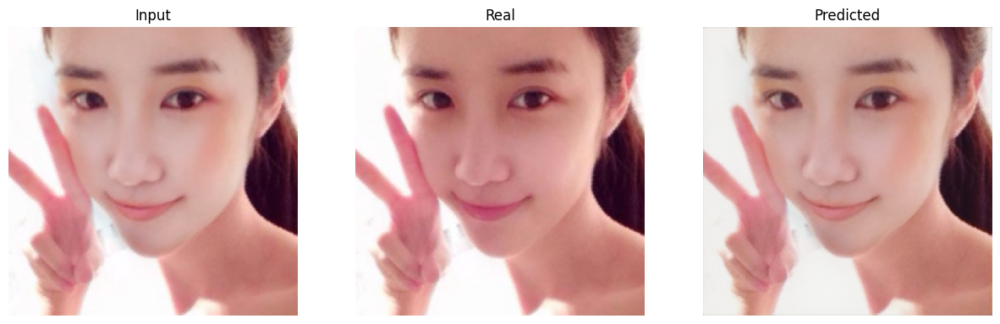

epoch: 9   loss: 49370.7109375

-------- psnr:  24.428202    ----- epoch:  9

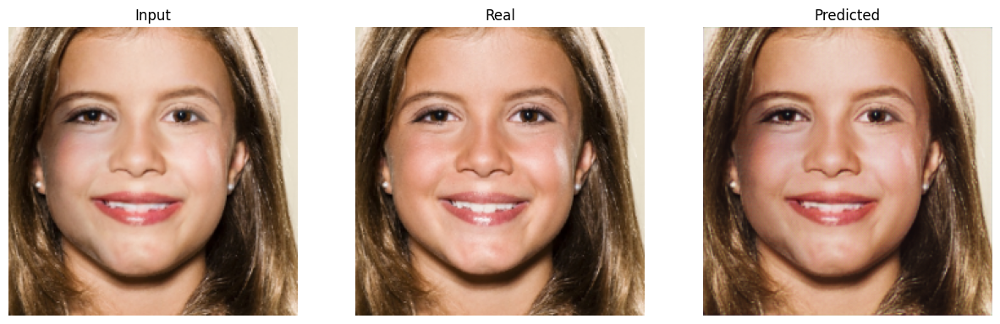

epoch: 10   loss: 48225.6484375

-------- psnr:  24.055178    ----- epoch:  10

epoch: 11   loss: 48759.734375

-------- psnr:  24.00439    ----- epoch:  11

epoch: 12   loss: 46622.05859375

-------- psnr:  24.345545    ----- epoch:  12

epoch: 13   loss: 45595.62890625

-------- psnr:  24.660343    ----- epoch:  13

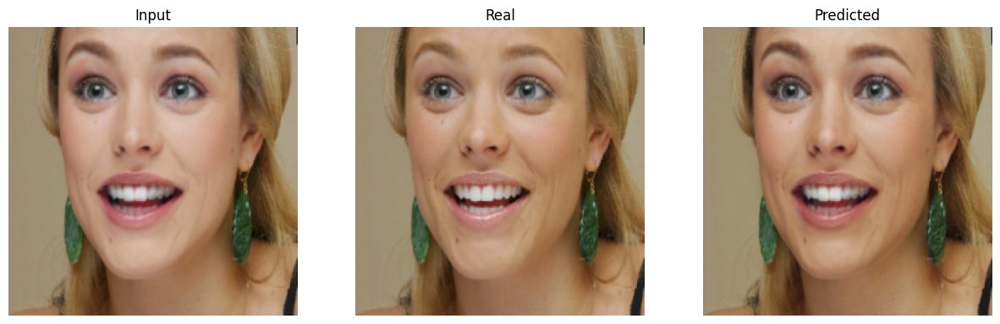

epoch: 14   loss: 44488.03125

-------- psnr:  24.638535    ----- epoch:  14

epoch: 15   loss: 43541.1640625

-------- psnr:  25.067204    ----- epoch:  15

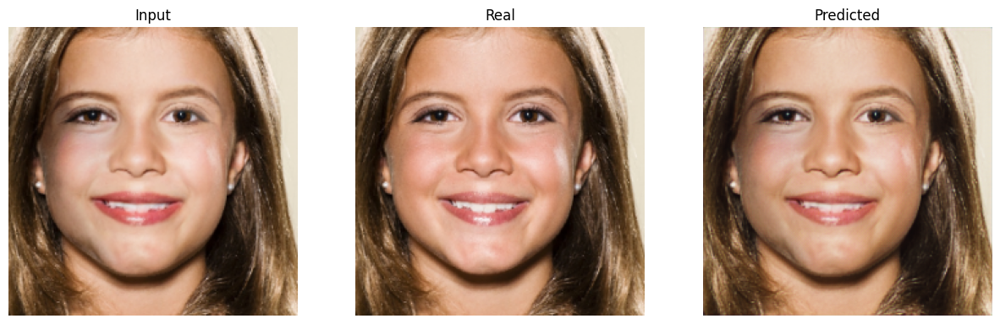

epoch: 16   loss: 41826.9296875

-------- psnr:  25.495396    ----- epoch:  16

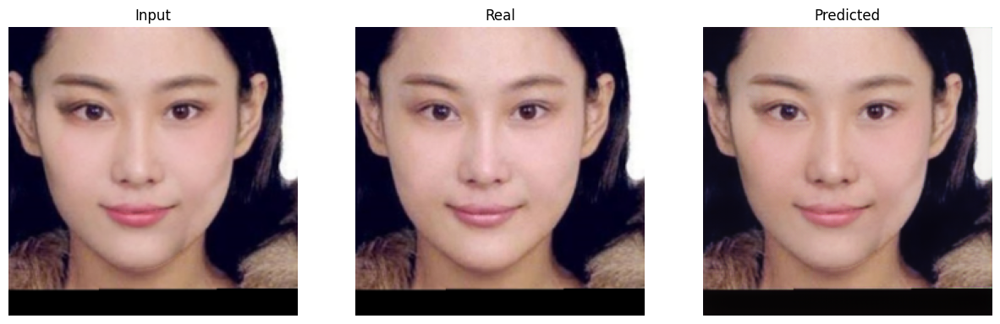

epoch: 17   loss: 41734.92578125

-------- psnr:  25.524162    ----- epoch:  17

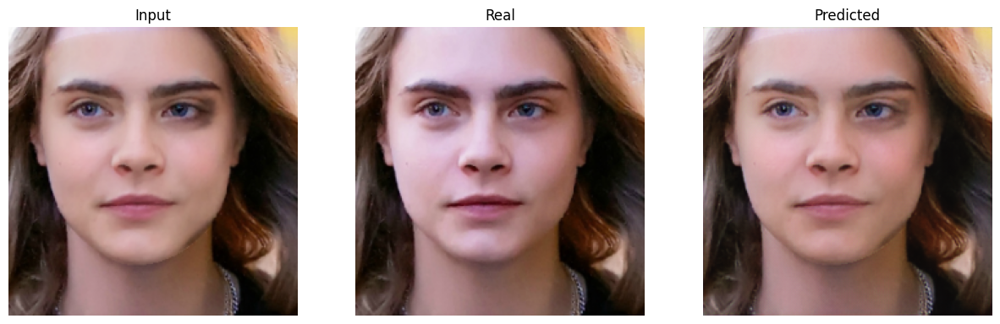

epoch: 18   loss: 39305.59765625

-------- psnr:  25.893002    ----- epoch:  18

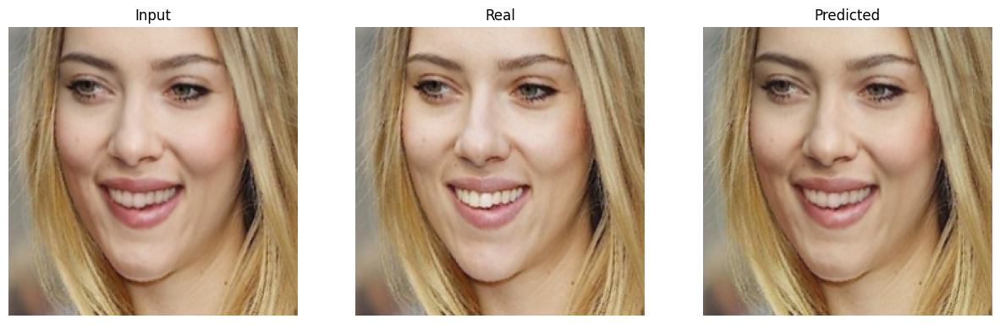

epoch: 19   loss: 38052.59375

-------- psnr:  25.20205    ----- epoch:  19

epoch: 20   loss: 36573.453125

-------- psnr:  26.306534    ----- epoch:  20

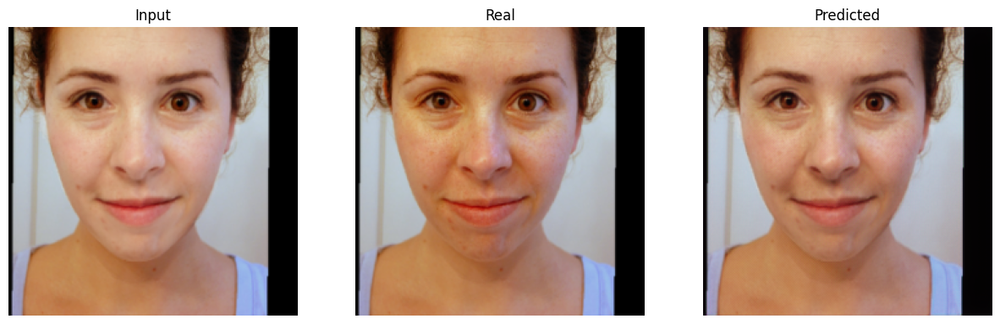

epoch: 21   loss: 35391.28515625

-------- psnr:  25.354755    ----- epoch:  21

epoch: 22   loss: 34255.06640625

-------- psnr:  25.87227    ----- epoch:  22

epoch: 23   loss: 32409.49609375

-------- psnr:  25.925882    ----- epoch:  23

epoch: 24   loss: 31336.658203125

-------- psnr:  26.333426    ----- epoch:  24

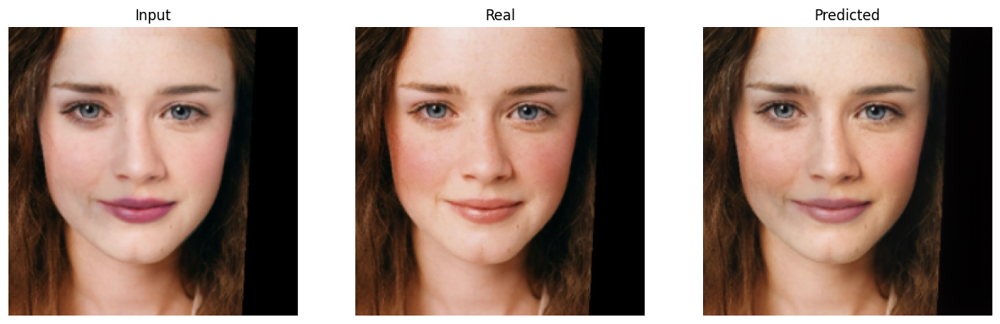

epoch: 25   loss: 29883.84765625

-------- psnr:  26.54223    ----- epoch:  25

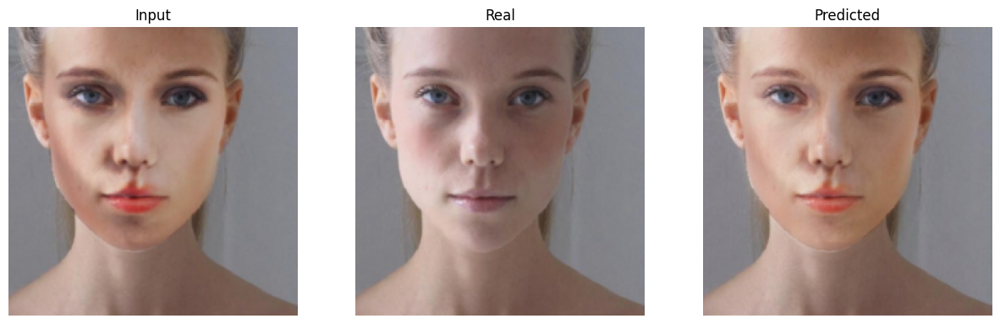

epoch: 26   loss: 28624.693359375

-------- psnr:  25.743412    ----- epoch:  26

epoch: 27   loss: 27530.54296875

-------- psnr:  25.363811    ----- epoch:  27

epoch: 28   loss: 26258.31640625

-------- psnr:  25.801085    ----- epoch:  28

epoch: 29   loss: 25259.111328125

-------- psnr:  25.260479    ----- epoch:  29

epoch: 30   loss: 25017.462890625

-------- psnr:  25.980263    ----- epoch:  30

epoch: 31   loss: 23408.177734375

-------- psnr:  26.2517    ----- epoch:  31

epoch: 32   loss: 22569.6171875

-------- psnr:  25.933414    ----- epoch:  32

epoch: 33   loss: 21912.67578125

-------- psnr:  26.898342    ----- epoch:  33

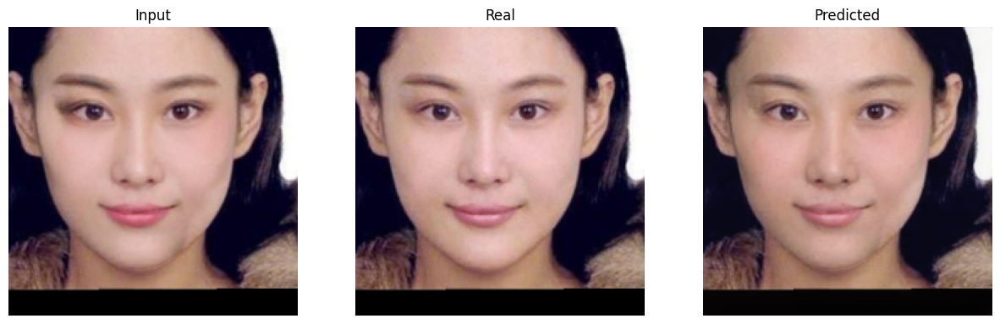

epoch: 34   loss: 20955.12109375

-------- psnr:  26.58439    ----- epoch:  34

epoch: 35   loss: 20496.978515625

-------- psnr:  26.237925    ----- epoch:  35

epoch: 36   loss: 20245.68359375

-------- psnr:  26.403759    ----- epoch:  36

epoch: 37   loss: 19564.009765625

-------- psnr:  26.229988    ----- epoch:  37

epoch: 38   loss: 19624.4609375

-------- psnr:  26.980526    ----- epoch:  38

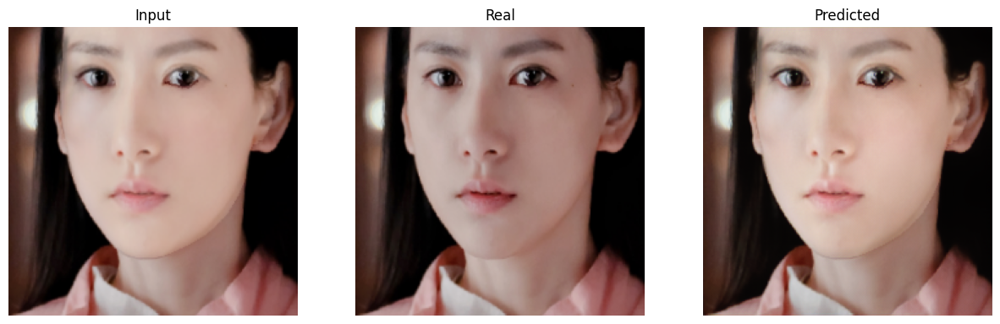

epoch: 39   loss: 18922.109375

-------- psnr:  26.518381    ----- epoch:  39

epoch: 40   loss: 18168.86328125

-------- psnr:  26.254204    ----- epoch:  40

epoch: 41   loss: 17446.828125

epoch: 42   loss: 17280.984375

-------- psnr:  26.605478    ----- epoch:  42

epoch: 43   loss: 16831.513671875

-------- psnr:  26.716154    ----- epoch:  43

epoch: 44   loss: 16316.169921875

-------- psnr:  27.004768    ----- epoch:  44

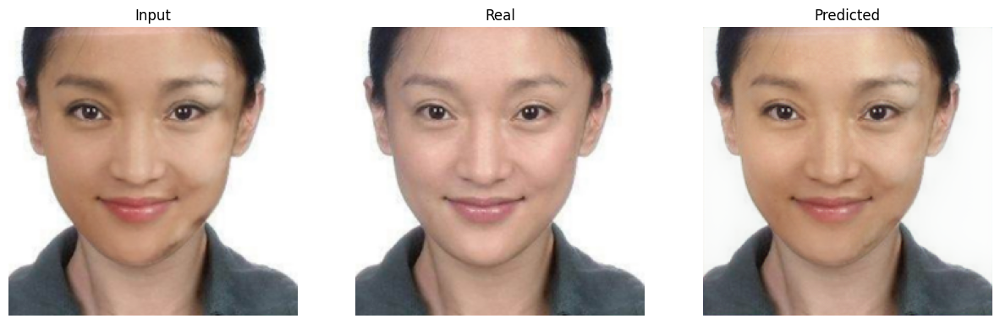

epoch: 45   loss: 16254.8154296875

-------- psnr:  26.35763    ----- epoch:  45

epoch: 46   loss: 15791.939453125

-------- psnr:  26.81082    ----- epoch:  46

epoch: 47   loss: 15452.7236328125

-------- psnr:  26.171791    ----- epoch:  47

epoch: 48   loss: 15418.904296875

-------- psnr:  25.826164    ----- epoch:  48

epoch: 49   loss: 15336.2744140625

-------- psnr:  26.51405    ----- epoch:  49

epoch: 50   loss: 14972.1494140625

-------- psnr:  26.49297    ----- epoch:  50

epoch: 51   loss: 14411.74609375

-------- psnr:  26.435478    ----- epoch:  51

epoch: 52   loss: 14353.0615234375

-------- psnr:  26.743029    ----- epoch:  52

epoch: 53   loss: 13865.5234375

-------- psnr:  26.435577    ----- epoch:  53

epoch: 54   loss: 13528.578125

-------- psnr:  27.255688    ----- epoch:  54

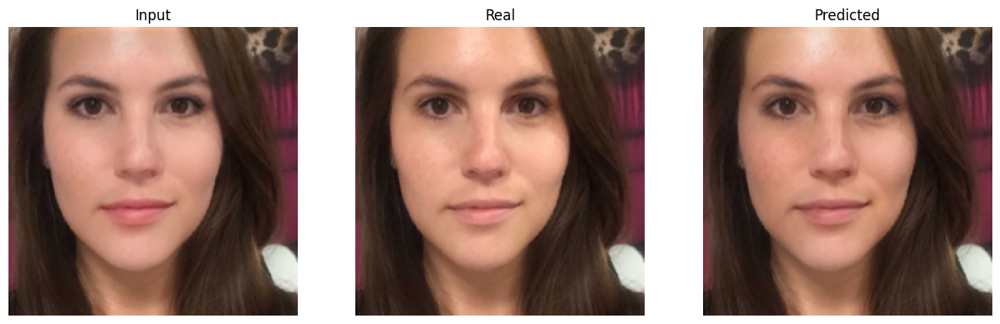

epoch: 55   loss: 13273.751953125

-------- psnr:  26.697079    ----- epoch:  55

epoch: 56   loss: 12930.66015625

-------- psnr:  27.182919    ----- epoch:  56

epoch: 57   loss: 12718.7900390625

-------- psnr:  26.530008    ----- epoch:  57

epoch: 58   loss: 12624.3173828125

-------- psnr:  26.555243    ----- epoch:  58

epoch: 59   loss: 12414.5

-------- psnr:  26.49437    ----- epoch:  59

epoch: 60   loss: 12440.6328125

-------- psnr:  26.583605    ----- epoch:  60

epoch: 61   loss: 12156.91015625

-------- psnr:  26.475    ----- epoch:  61

epoch: 62   loss: 11805.791015625

-------- psnr:  27.112373    ----- epoch:  62

epoch: 63   loss: 11450.7392578125

-------- psnr:  26.70712    ----- epoch:  63

epoch: 64   loss: 11408.1337890625

-------- psnr:  26.542957    ----- epoch:  64

epoch: 65   loss: 11144.71484375

-------- psnr:  26.327665    ----- epoch:  65

epoch: 66   loss: 11035.4150390625

-------- psnr:  26.211662    ----- epoch:  66

epoch: 67   loss: 10932.4091796875

-------- psnr:  26.837454    ----- epoch:  67

epoch: 68   loss: 10969.76953125

-------- psnr:  26.772835    ----- epoch:  68

epoch: 69   loss: 10864.1298828125

-------- psnr:  26.586445    ----- epoch:  69

epoch: 70   loss: 10722.74609375

-------- psnr:  26.57048    ----- epoch:  70

epoch: 71   loss: 10547.8056640625

-------- psnr:  26.97835    ----- epoch:  71

epoch: 72   loss: 10528.3212890625

-------- psnr:  27.013416    ----- epoch:  72

epoch: 73   loss: 10291.236328125

-------- psnr:  27.20208    ----- epoch:  73

epoch: 74   loss: 10320.283203125

-------- psnr:  26.742722    ----- epoch:  74

epoch: 75   loss: 10201.28125

-------- psnr:  26.85113    ----- epoch:  75

epoch: 76   loss: 9858.5263671875

-------- psnr:  27.084747    ----- epoch:  76

epoch: 77   loss: 9600.4619140625

-------- psnr:  26.811565    ----- epoch:  77

epoch: 78   loss: 9577.658203125

-------- psnr:  26.695345    ----- epoch:  78

epoch: 79   loss: 9376.1630859375

-------- psnr:  26.7547    ----- epoch:  79

epoch: 80   loss: 9302.037109375

-------- psnr:  26.54162    ----- epoch:  80

epoch: 81   loss: 9252.5302734375

-------- psnr:  26.949005    ----- epoch:  81

epoch: 82   loss: 9149.24609375

-------- psnr:  26.74047    ----- epoch:  82

epoch: 83   loss: 9042.69921875

-------- psnr:  27.054794    ----- epoch:  83

epoch: 84   loss: 8840.4296875

-------- psnr:  26.015087    ----- epoch:  84

epoch: 85   loss: 8866.7021484375

-------- psnr:  26.814877    ----- epoch:  85

epoch: 86   loss: 8643.986328125

-------- psnr:  27.245499    ----- epoch:  86

epoch: 87   loss: 8561.1298828125

-------- psnr:  26.74231    ----- epoch:  87

epoch: 88   loss: 8480.2412109375

-------- psnr:  26.571726    ----- epoch:  88

epoch: 89   loss: 8375.1015625

-------- psnr:  26.639172    ----- epoch:  89

epoch: 90   loss: 8231.505859375

-------- psnr:  27.001127    ----- epoch:  90

epoch: 91   loss: 8447.9189453125

-------- psnr:  27.545092    ----- epoch:  91

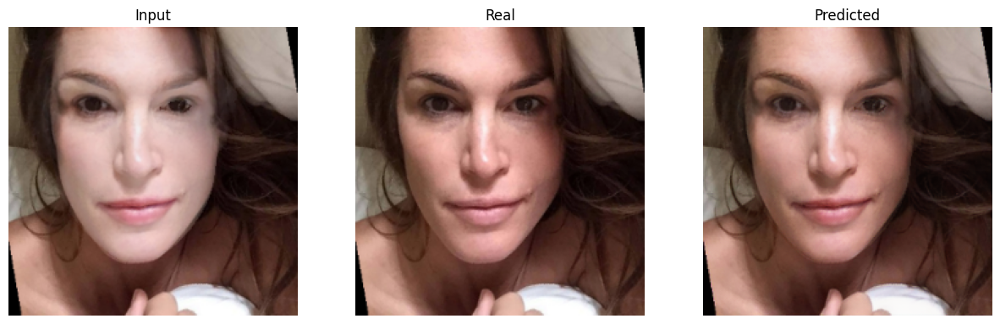

epoch: 92   loss: 8364.634765625

-------- psnr:  27.08937    ----- epoch:  92

epoch: 93   loss: 8221.34375

-------- psnr:  26.647669    ----- epoch:  93

epoch: 94   loss: 8219.533203125

-------- psnr:  26.688705    ----- epoch:  94

epoch: 95   loss: 8101.1953125

-------- psnr:  27.228216    ----- epoch:  95

epoch: 96   loss: 7922.9814453125

-------- psnr:  27.314327    ----- epoch:  96

epoch: 97   loss: 7979.08447265625

-------- psnr:  26.555237    ----- epoch:  97

epoch: 98   loss: 8037.57666015625

-------- psnr:  27.33385    ----- epoch:  98

epoch: 99   loss: 7860.40625

-------- psnr:  27.27231    ----- epoch:  99

epoch: 100   loss: 7622.5947265625

-------- psnr:  26.721668    ----- epoch:  100

epoch: 101   loss: 7581.203125

-------- psnr:  26.560244    ----- epoch:  101

epoch: 102   loss: 7652.455078125

-------- psnr:  26.736809    ----- epoch:  102

epoch: 103   loss: 7534.046875

-------- psnr:  27.020418    ----- epoch:  103

epoch: 104   loss: 7684.8974609375

-------- psnr:  26.632002    ----- epoch:  104

epoch: 105   loss: 7630.8974609375

-------- psnr:  27.187572    ----- epoch:  105

epoch: 106   loss: 7442.4814453125

-------- psnr:  27.442657    ----- epoch:  106

epoch: 107   loss: 7266.591796875

-------- psnr:  27.152897    ----- epoch:  107

epoch: 108   loss: 7166.41162109375

-------- psnr:  26.545664    ----- epoch:  108

epoch: 109   loss: 7060.09423828125

-------- psnr:  26.87755    ----- epoch:  109

epoch: 110   loss: 6948.8115234375

-------- psnr:  26.816048    ----- epoch:  110

epoch: 111   loss: 6996.7783203125

-------- psnr:  27.406937    ----- epoch:  111

epoch: 112   loss: 7035.83349609375

-------- psnr:  26.46238    ----- epoch:  112

epoch: 113   loss: 6862.3173828125

-------- psnr:  26.583073    ----- epoch:  113

epoch: 114   loss: 6844.7666015625

-------- psnr:  27.034613    ----- epoch:  114

epoch: 115   loss: 6661.85009765625

-------- psnr:  26.958263    ----- epoch:  115

epoch: 116   loss: 6577.49169921875

-------- psnr:  26.772356    ----- epoch:  116

epoch: 117   loss: 6530.951171875

-------- psnr:  26.83044    ----- epoch:  117

epoch: 118   loss: 6680.6533203125

-------- psnr:  26.745104    ----- epoch:  118

epoch: 119   loss: 6521.83984375

-------- psnr:  26.575315    ----- epoch:  119

epoch: 120   loss: 6626.06494140625

-------- psnr:  26.19498    ----- epoch:  120

epoch: 121   loss: 6811.228515625

-------- psnr:  27.210857    ----- epoch:  121

epoch: 122   loss: 6676.34326171875

-------- psnr:  26.621634    ----- epoch:  122

epoch: 123   loss: 6522.2412109375

-------- psnr:  26.952894    ----- epoch:  123

epoch: 124   loss: 6519.2548828125

-------- psnr:  26.868858    ----- epoch:  124

epoch: 125   loss: 6272.314453125

-------- psnr:  26.73248    ----- epoch:  125

epoch: 126   loss: 6230.42333984375

-------- psnr:  26.829384    ----- epoch:  126

epoch: 127   loss: 6114.8662109375

-------- psnr:  27.341202    ----- epoch:  127

epoch: 128   loss: 6193.40673828125

-------- psnr:  26.716152    ----- epoch:  128

epoch: 129   loss: 6276.15283203125

-------- psnr:  27.077751    ----- epoch:  129

epoch: 130   loss: 6301.59619140625

-------- psnr:  26.552094    ----- epoch:  130

epoch: 131   loss: 6183.42919921875

-------- psnr:  27.207937    ----- epoch:  131

epoch: 132   loss: 6261.46142578125

-------- psnr:  27.184063    ----- epoch:  132

epoch: 133   loss: 6097.60595703125

-------- psnr:  26.7293    ----- epoch:  133

epoch: 134   loss: 6080.3896484375

-------- psnr:  26.937588    ----- epoch:  134

epoch: 135   loss: 6256.84375

-------- psnr:  27.016708    ----- epoch:  135

epoch: 136   loss: 6122.828125

-------- psnr:  26.88533    ----- epoch:  136

epoch: 137   loss: 6184.79833984375

-------- psnr:  26.59238    ----- epoch:  137

epoch: 138   loss: 5897.04248046875

-------- psnr:  27.326963    ----- epoch:  138

epoch: 139   loss: 5728.05859375

-------- psnr:  26.5203    ----- epoch:  139

epoch: 140   loss: 5656.208984375

-------- psnr:  26.791767    ----- epoch:  140

epoch: 141   loss: 5522.4658203125

-------- psnr:  27.009193    ----- epoch:  141

epoch: 142   loss: 5445.51708984375

-------- psnr:  26.795422    ----- epoch:  142

epoch: 143   loss: 5389.80322265625

-------- psnr:  27.085564    ----- epoch:  143

epoch: 144   loss: 5399.64501953125

-------- psnr:  27.212093    ----- epoch:  144

epoch: 145   loss: 5543.326171875

-------- psnr:  26.660702    ----- epoch:  145

epoch: 146   loss: 5498.9560546875

-------- psnr:  26.580727    ----- epoch:  146

epoch: 147   loss: 5571.24609375

-------- psnr:  26.95419    ----- epoch:  147

epoch: 148   loss: 5409.57666015625

-------- psnr:  27.44557    ----- epoch:  148

epoch: 149   loss: 5454.3154296875

-------- psnr:  26.58522    ----- epoch:  149

In [36]:
def train_model():
    best_pnsr = 0.0
    for epoch in track(range(cfg.epochs)):
        epoch_loss = 0
        
        for inputs, targets in train_loader:
            inputs = inputs.to(cfg.device)
            targets = targets.to(cfg.device)
            
            fake = model(inputs)
            loss = generator_loss(fake, targets)

            generator_optimizer.zero_grad()
            loss.backward()
            generator_optimizer.step()

            epoch_loss += loss/len(train_loader)

            torch.cuda.empty_cache()

        print('epoch: {}   loss: {}'.format(epoch, epoch_loss))
        
        with torch.no_grad():
            psnr_mean = 0.0
            model.eval()
            for inputs, targets in valid_loader:
                inputs = inputs.to(cfg.device)
                targets = targets.to(cfg.device)

                fake = model(inputs)
                psnr = torchmetrics.functional.peak_signal_noise_ratio(fake, targets, data_range=1.0)
            
                psnr_mean += psnr/len(valid_loader)

            print('-------- psnr: ', psnr_mean.data.cpu().numpy(), '   ----- epoch: ', epoch)

            if best_pnsr < psnr_mean:
                best_pnsr = psnr_mean
            
                inputs, targets = next(iter(valid_loader))

                input = inputs[0]
                target = targets[0]

                fake = model(input.unsqueeze(0).to(cfg.device))
                fake = fake.squeeze().data.cpu()

                plt.figure(figsize=(15,20))

                input = invTrans(input)
                
                display_list = [input.permute(1,2,0), target.permute(1,2,0), fake.permute(1,2,0)]
                
                title = ['Input', 'Real', 'Predicted']    

                for i in range(3):
                    plt.subplot(1, 3, i+1)
                    plt.title(title[i])
                    plt.imshow(display_list[i])
                    plt.axis('off')
                plt.show()  
train_model()

## Evaluate Results

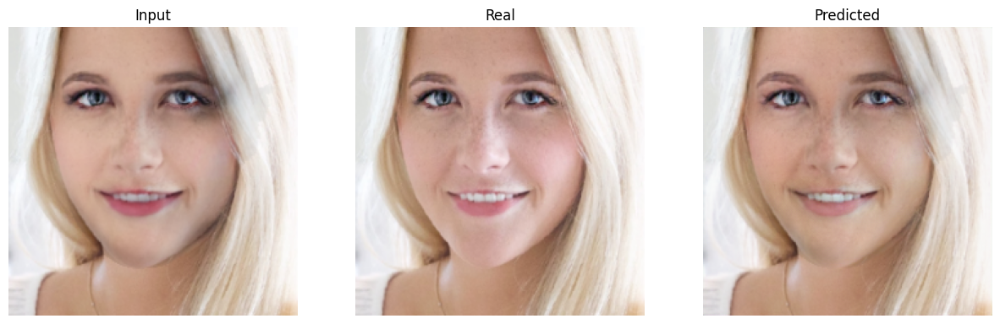

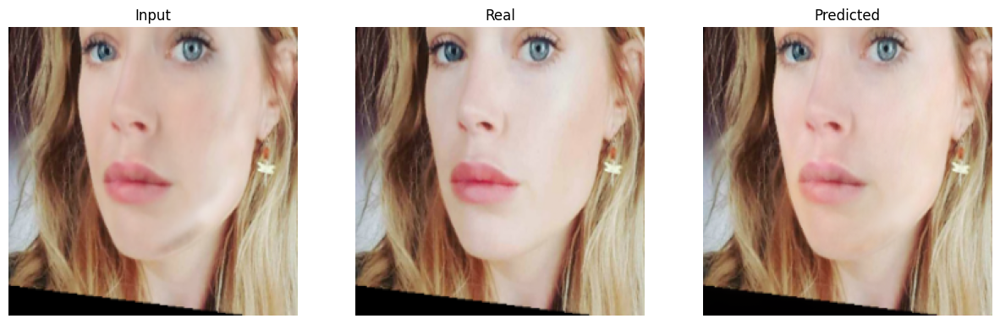

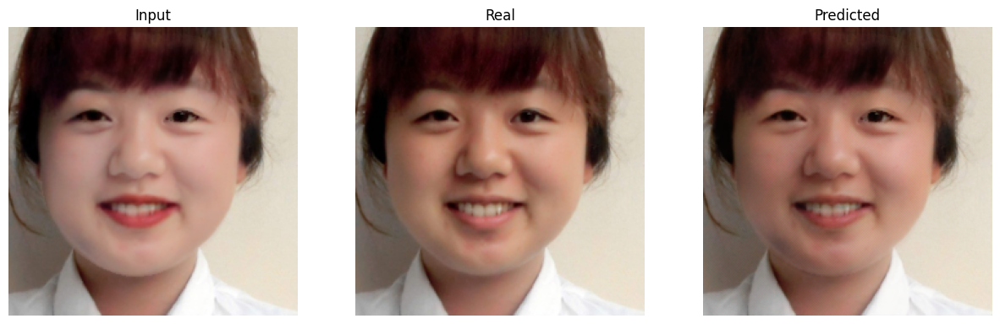

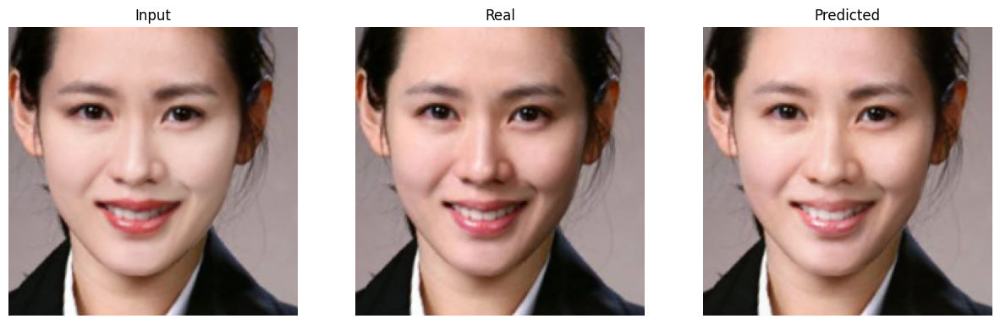

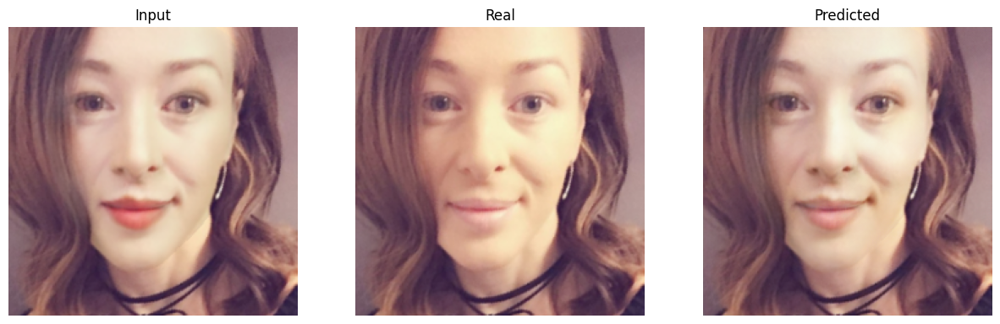

In [37]:
for _ in range(5):
    inputs, targets = next(iter(valid_loader))

    input = inputs[0]
    target = targets[0]

    fake = model(input.unsqueeze(0).to(cfg.device))
    fake = fake.squeeze().data.cpu()

    plt.figure(figsize=(15,20))

    input = invTrans(input)
    
    display_list = [input.permute(1,2,0), target.permute(1,2,0), fake.permute(1,2,0)]
    
    title = ['Input', 'Real', 'Predicted']    

    for i in range(3):
        plt.subplot(1, 3, i+1)
        plt.title(title[i])
        plt.imshow(display_list[i])
        plt.axis('off')
    plt.show()  